In [2]:
import pandas as pd
import pandas_datareader.data as pdweb

import numpy as np

from datetime import datetime

import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 300
plt.rcParams['figure.figsize'] = (15, 8)
plt.style.use('seaborn-white')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [5]:
x = pdweb.DataReader('ITUB3.SA', 'yahoo', start='2000-01-01', end=datetime.now())
#itub3 = itub3.loc['2010':'2018']
x = x.loc['2000':'2010'].copy()

In [7]:
def MA(Series, n):
    return Series.rolling(n).mean()

In [14]:
class Strategy():
    def __init__(self, asset, price_column='Adj Close'):
        self.data = asset
        self.price_data = asset[price_column]
        self.position = 0
        self.price = 0
        self.profit = 0
        self.trades = []
        
    def buy(self, pos, qnt=1):
        price = self.price_data[pos]
        if self.position < 0:
            #self.calc_profit(price, qnt)
            self.position += qnt
            self.profit += -(self.price - price)*qnt
        if self.position == 0:
            self.price = price
            self.position += qnt
        elif self.position > 0:
            self.price = (self.position * self.price + price * qnt) / (self.position + qnt)
            self.position += qnt
            
        self.trades.append([self.data.index[pos], qnt, price, self.position, self.price, self.profit])
        
    def sell(self, pos, qnt=-1):
        price = self.price_data[pos]
        if self.position > 0:
            self.position += qnt
            self.profit += -(price - self.price)*qnt
        #    self.calc_profit(price, qnt)
        if self.position == 0:
            self.price = price
            self.position += qnt
        elif self.position < 0:
            self.price = (self.position * self.price + price * qnt) / (self.position + qnt)
            self.position += qnt
            
        self.trades.append([self.data.index[pos], qnt, price, self.position, self.price, self.profit])

    def close(self, pos):
        if self.position > 0: 
            self.sell(pos, qnt=-self.position)
        if self.position < 0:
            self.buy(pos, qnt=-self.position)
    
    #def calc_profit(self, price, qnt):
    #    self.profit += (price - self.price) * -qnt
    #    if (self.position + qnt) == 0:
    #        self.price = 0
    #        self.position = 0
    #    else:
    #        self.price = (self.price * abs(self.position) + price * abs(qnt)) / (abs(self.position) + abs(qnt))
    #        self.position += qnt

In [15]:
def SMA_crossover(strat, n1, n2):
    asset = strat.price_data
    faster = min(n1, n2)
    slower = max(n1, n2)
    sma1 = MA(asset, faster)
    sma2 = MA(asset, slower)
    
    def crossover(pos):
        if sma1[pos-2] < sma2[pos-2] and sma1[pos-1] > sma2[pos-1]:
            strat.buy(pos)
        
        elif sma1[pos-2] > sma2[pos-2] and sma1[pos-1] < sma2[pos-1]:
            strat.sell(pos)
            
    for i in range(asset.shape[0]):
        crossover(i)
        
    x = pd.DataFrame(strat.trades)
    x.columns = ['Data', 'Operação qnt', 'Preço', 'Quantidade', 'Preço médio', 'Lucro Acumulado']
    
    return x

In [16]:
teste = SMA_crossover(Strategy(x), 63, 5)

In [19]:
teste

,Data,Operação qnt,Preço,Quantidade,Preço médio,Lucro Acumulado
0,2000-04-04,1,1.379795,1,1.379795,0.000000
1,2000-04-18,-1,1.207323,-1,1.207323,-0.172473
2,2000-06-12,1,1.298633,1,1.298633,-0.081162
3,2000-09-25,-1,1.481252,-1,1.481252,0.101456
4,2000-10-31,1,1.643583,1,1.643583,0.263788
...,...,...,...,...,...,...
65,2010-04-29,-1,8.758161,-1,8.758161,7.378365
66,2010-07-14,1,8.664251,1,8.664251,7.284456
67,2010-08-31,-1,8.731345,-1,8.731345,7.351550
68,2010-09-01,1,8.798884,1,8.798884,7.419089


In [11]:
from backtesting import Strategy
from backtesting.lib import crossover
from backtesting import Backtest

import talib

In [18]:
class SmaCross(Strategy):

    n1 = 38
    n2 = 41

    def init(self):
        self.sma1 = self.I(talib.SMA, x['Adj Close'], self.n1)
        self.sma2 = self.I(talib.SMA, x['Adj Close'], self.n2)
        
    def next(self):
        if crossover(self.sma1, self.sma2):
            self.position.close()
            self.buy()
            
        elif crossover(self.sma2, self.sma1):
            self.position.close()
            self.sell()

In [13]:
SmaCross.n1 = 100
SmaCross.n2 = 200

In [15]:
bt = Backtest(x, SmaCross, cash=100, commission=0)
stats = bt.run()

In [16]:
stats

Start                     2000-01-03 00:00:00
End                       2010-12-30 00:00:00
Duration                   4014 days 00:00:00
Exposure Time [%]                     55.3412
Equity Final [$]                      422.645
Equity Peak [$]                       698.128
Return [%]                            322.645
Buy & Hold Return [%]                 508.927
Max. Drawdown [%]                     -49.053
Avg. Drawdown [%]                    -7.75479
Max. Drawdown Duration      798 days 00:00:00
Avg. Drawdown Duration       64 days 00:00:00
# Trades                                    6
Win Rate [%]                          83.3333
Best Trade [%]                        103.637
Worst Trade [%]                      -16.7566
Avg. Trade [%]                        28.5242
Max. Trade Duration         698 days 00:00:00
Avg. Trade Duration         372 days 00:00:00
Profit Factor                         13.3842
Expectancy [%]                        40.1717
SQN                               

In [167]:
stats, heatmap = bt.optimize(n1=range(2, 252), n2=range(3, 252), maximize='Equity Final [$]', constraint=lambda param: param.n1 < param.n2, return_heatmap=True)

&lt;AxesSubplot:xlabel=&#39;n2&#39;, ylabel=&#39;n1&#39;&gt;

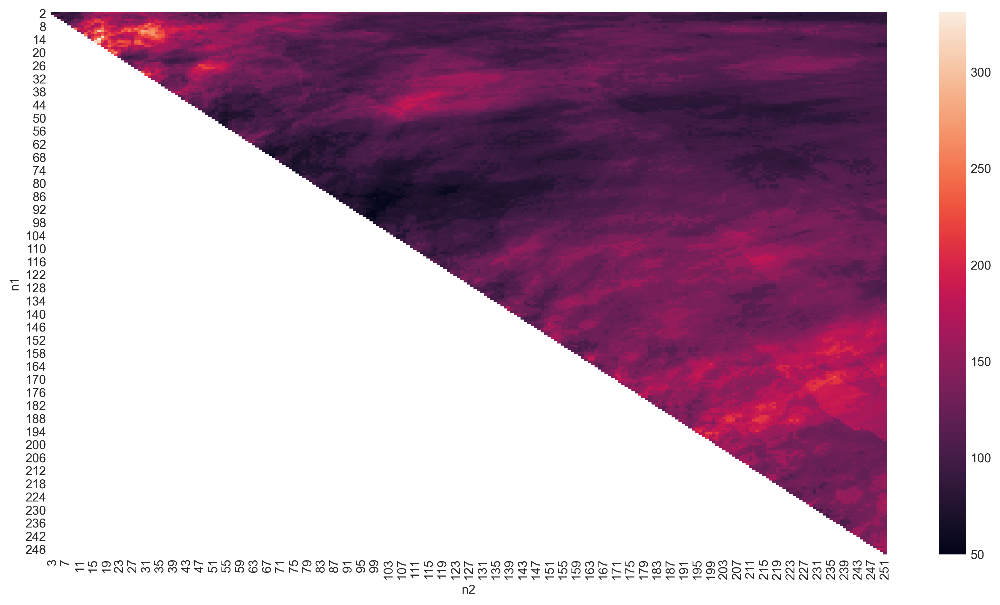

In [168]:
import seaborn as sns
sns.heatmap(heatmap.groupby(['n1', 'n2']).mean().unstack())

In [171]:
stats._strategy

&lt;Strategy SmaCross(n1=14,n2=17)&gt;

In [3]:
x = pdweb.DataReader('^BVSP', 'yahoo', start='2020-09-21', end=datetime.now())
#itub3 = itub3.loc['2010':'2018']

In [3]:
lista = pd.read_clipboard()

In [9]:
res = pd.DataFrame()
for z in list(lista['lista']):
    try:
        x = pdweb.DataReader(f'{z}.SA', 'yahoo', start='2020-02-01', end=datetime.now())
        res = pd.concat([res, x['Adj Close'].rename(z)], axis=1)
    except:
        print(f'toma no cu {z}')

In [10]:
res.to_excel('p_fiis.xlsx')